In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
%cd /content/drive/MyDrive/sia/format

/content/drive/MyDrive/sia/format


# Install detectron2

In [ ]:
!pip install pyyaml==5.1

import torch
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
# Install detectron2 that matches the above pytorch version
# See https://detectron2.readthedocs.io/tutorials/install.html for instructions
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/$CUDA_VERSION/torch$TORCH_VERSION/index.html
# If there is not yet a detectron2 release that matches the given torch + CUDA version, you need to install a different pytorch.

# exit(0)  # After installation, you may need to "restart runtime" in Colab. This line can also restart runtime

     |████████████████████████████████| 274 kB 13.9 MB/s 
  Created wheel for pyyaml: filename=PyYAML-5.1-cp37-cp37m-linux_x86_64.whl size=44092 sha256=2199ab4cefc8d313a629955b4f3b87ed838823aca8a58fb62580d3ee6799c372
  Stored in directory: /root/.cache/pip/wheels/77/f5/10/d00a2bd30928b972790053b5de0c703ca87324f3fead0f2fd9
Successfully built pyyaml
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13
torch:  1.10 ; cuda:  cu111
Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu111/torch1.10/index.html
     |████████████████████████████████| 7.0 MB 717 kB/s 
     |████████████████████████████████| 74 kB 4.0 MB/s 
     |████████████████████████████████| 145 kB 39.6 MB/s 
     |████████████████████████████████| 49 kB 8.5 MB/s 
     |████████████████████████████████| 130 kB 64.5 MB/s 
     |████████████████████████████████| 843 kB 62.3 MB/s 
     |██████████████████████████████

In [ ]:
# You may need to restart your runtime prior to this, to let your installation take effect
# Some basic setup
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import matplotlib.pyplot as plt
import numpy as np
import cv2
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

In [ ]:
from detectron2 import model_zoo
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg
import os

In [ ]:
!ls /content/drive/MyDrive/sia/format/Objects/train/image | wc -l

1748


In [ ]:
# coco 데이터셋에 sia 객체 instance를 추가해준다.
from detectron2.data.datasets import register_coco_instances
register_coco_instances("sia_train", {}, "/content/drive/Shareddrives/해커톤/coco_format/traincoco.json", "/content/drive/MyDrive/sia/format/Objects/train/image")
sia_metadata = MetadataCatalog.get("sia_train")
dataset_dicts = DatasetCatalog.get("sia_train")

[12/07 17:43:57 d2.data.datasets.coco]: Loading /content/drive/Shareddrives/해커톤/coco_format/traincoco.json takes 6.87 seconds.
[12/07 17:43:57 d2.data.datasets.coco]: Loaded 1748 images in COCO format from /content/drive/Shareddrives/해커톤/coco_format/traincoco.json


In [ ]:
# 정의한 sia_metadata 확인
print(sia_metadata)
print(DatasetCatalog.get("sia_train"))

Metadata(evaluator_type='coco', image_root='/content/drive/MyDrive/sia/format/Objects/train/image', json_file='/content/drive/Shareddrives/해커톤/coco_format/traincoco.json', name='sia_train', thing_classes=['small ship', 'large ship', 'civilian aircraft', 'military aircraft', 'small car', 'bus', 'truck', 'train', 'crane', 'bridge', 'oil tank', 'dam', 'indoor playground', 'outdoor playground', 'helipad', 'roundabout', 'helicopter', 'individual container', 'grouped container', 'swimming pool', 'etc'], thing_dataset_id_to_contiguous_id={1: 0, 2: 1, 3: 2, 4: 3, 5: 4, 6: 5, 7: 6, 8: 7, 9: 8, 10: 9, 11: 10, 12: 11, 13: 12, 14: 13, 15: 14, 16: 15, 17: 16, 18: 17, 19: 18, 20: 19, 21: 20})
[12/07 17:44:05 d2.data.datasets.coco]: Loading /content/drive/Shareddrives/해커톤/coco_format/traincoco.json takes 4.84 seconds.
[12/07 17:44:05 d2.data.datasets.coco]: Loaded 1748 images in COCO format from /content/drive/Shareddrives/해커톤/coco_format/traincoco.json


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



# Val Metadata

In [ ]:
!ls /content/drive/MyDrive/val/image | wc -l

220


In [ ]:
# coco 데이터셋에 sia 객체 instance를 추가해준다.
from detectron2.data.datasets import register_coco_instances
register_coco_instances("sia_val", {}, "/content/drive/Shareddrives/해커톤/coco_format/valcoco.json", "/content/drive/MyDrive/val/image")
sia_val_metadata = MetadataCatalog.get("sia_val")
dataset_dicts = DatasetCatalog.get("sia_val")

[12/07 17:44:14 d2.data.datasets.coco]: Loading /content/drive/Shareddrives/해커톤/coco_format/valcoco.json takes 1.22 seconds.
[12/07 17:44:14 d2.data.datasets.coco]: Loaded 220 images in COCO format from /content/drive/Shareddrives/해커톤/coco_format/valcoco.json


In [ ]:
# 정의한 sia_val metadata 확인
print(sia_val_metadata)
print(DatasetCatalog.get("sia_val"))

Metadata(evaluator_type='coco', image_root='/content/drive/MyDrive/val/image', json_file='/content/drive/Shareddrives/해커톤/coco_format/valcoco.json', name='sia_val', thing_classes=['small ship', 'large ship', 'civilian aircraft', 'military aircraft', 'small car', 'bus', 'truck', 'train', 'crane', 'bridge', 'oil tank', 'dam', 'indoor playground', 'outdoor playground', 'helipad', 'roundabout', 'helicopter', 'individual container', 'grouped container', 'swimming pool', 'etc'], thing_dataset_id_to_contiguous_id={1: 0, 2: 1, 3: 2, 4: 3, 5: 4, 6: 5, 7: 6, 8: 7, 9: 8, 10: 9, 11: 10, 12: 11, 13: 12, 14: 13, 15: 14, 16: 15, 17: 16, 18: 17, 19: 18, 20: 19, 21: 20})
[12/07 17:44:15 d2.data.datasets.coco]: Loaded 220 images in COCO format from /content/drive/Shareddrives/해커톤/coco_format/valcoco.json


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



# Label data check

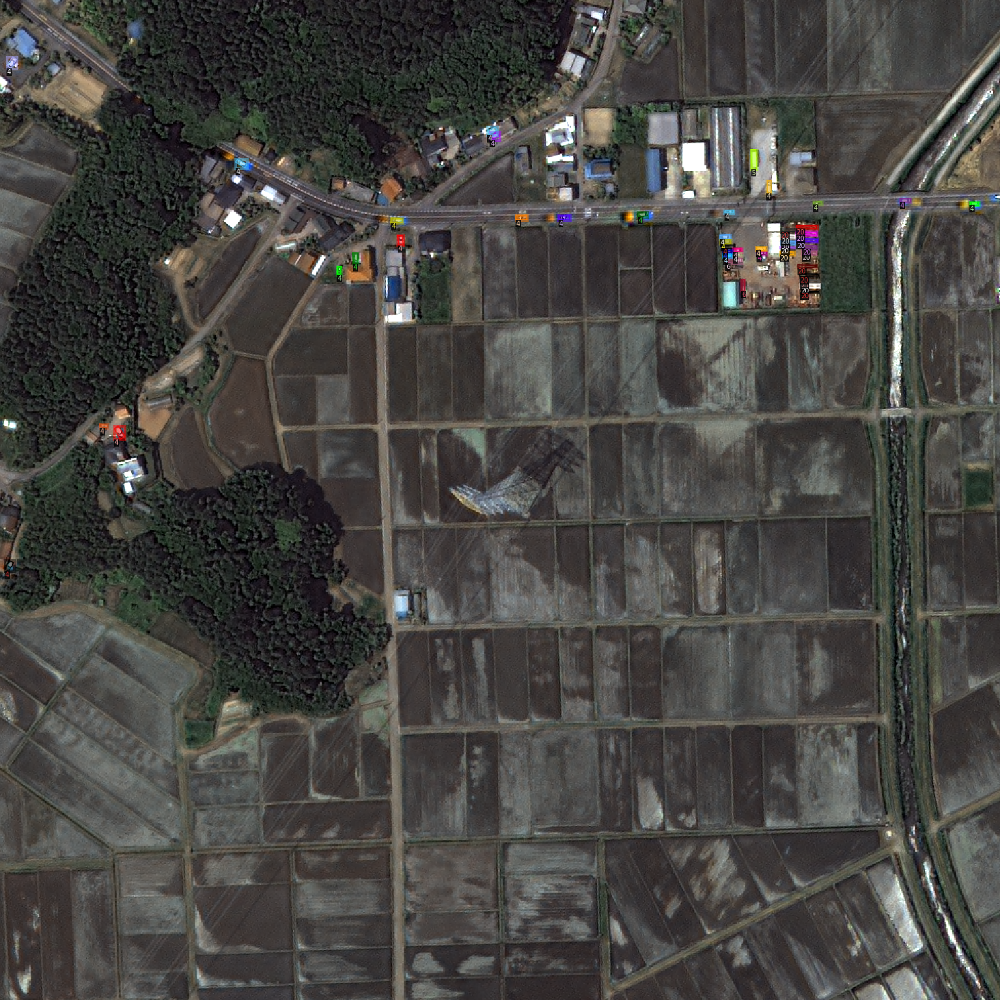

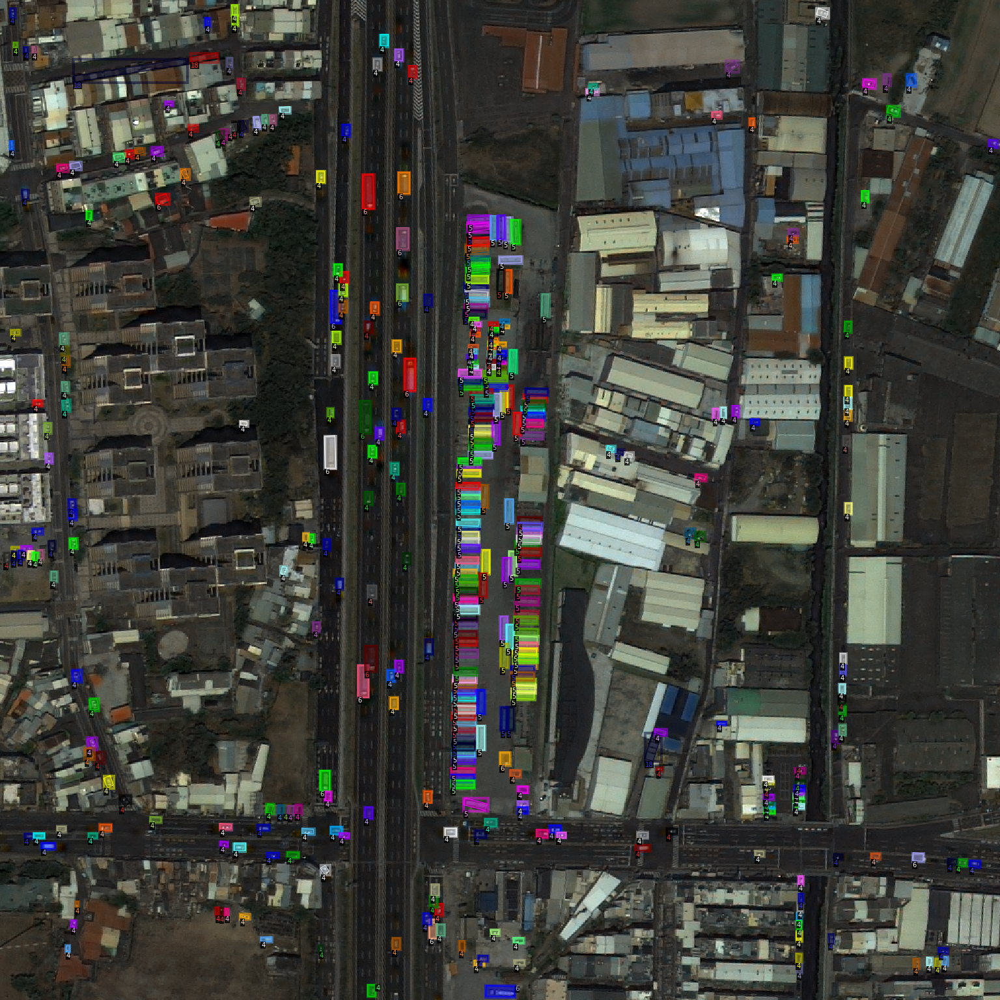

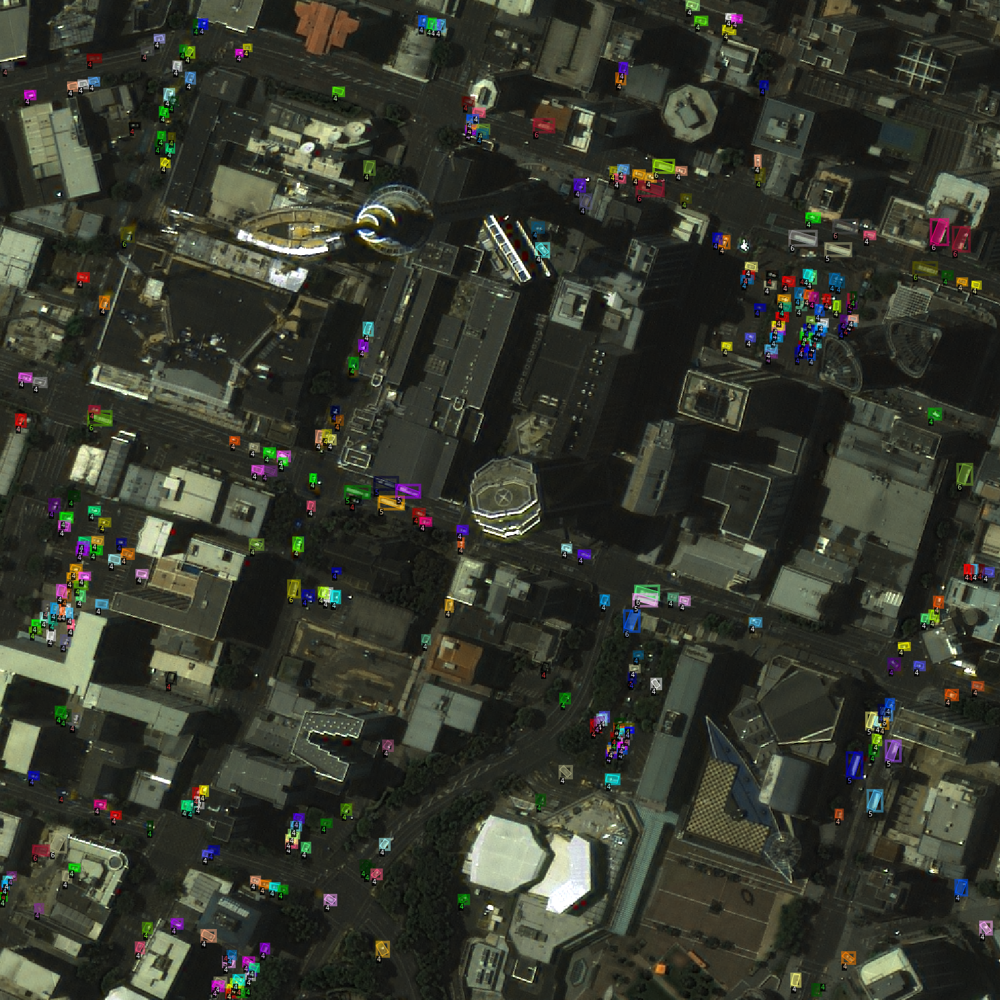

In [ ]:
import random

for d in random.sample(dataset_dicts, 3):

    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=sia_metadata, scale=1.5)
    vis = visualizer.draw_dataset_dict(d)
    cv2_imshow(vis.get_image()[:, :, ::-1])

# Step 7

In [ ]:
sweep_config = {
    'method': 'bayes'  # random, grid등 사용 가능
}


metric = {  # method를 bayes로 사용한다면 반드시 metric이 정의되어야 한다.
    'name': 'total_loss',  # name은 학습코드에서 log로 지정한 이름과 같아야 함 (total_loss는 detectron2/engine/train_loop.py 파일에서 run_step 함수에 log를 찍어놓음)
    'goal': 'minimize'
}
sweep_config['metric'] = metric


parameters_dict = {

    'learning_rate': {  
        'distribution': 'uniform',  #  uniform distribution 즉 균둥분포로 lr을 뽑겠다는 의미 
        'min' : 0,
        'max' : 0.001
    },
    'IMS_PER_BATCH': {
        'values': [2, 4, 8]
    },
    'iteration': {
        'values': [300, 1000, 1500, 5000]
    },
    'BATCH_SIZE_PER_IMAGE' : {
        'values': [32, 64, 128, 256]
    },    
    'model': {
        'value' : 'COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_1x.yaml'
    }
    
        
}
sweep_config['parameters'] = parameters_dict

import pprint
pprint.pprint(sweep_config)

{'method': 'bayes',
 'metric': {'goal': 'minimize', 'name': 'total_loss'},
 'parameters': {'BATCH_SIZE_PER_IMAGE': {'values': [32, 64, 128, 256]},
                'IMS_PER_BATCH': {'values': [2, 4, 8]},
                'iteration': {'values': [300, 1000, 1500, 5000]},
                'learning_rate': {'distribution': 'uniform',
                                  'max': 0.001,
                                  'min': 0},
                'model': {'value': 'COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_1x.yaml'}}}


In [ ]:
!pip install wandb

     |████████████████████████████████| 1.7 MB 12.4 MB/s 
     |████████████████████████████████| 140 kB 43.1 MB/s 
     |████████████████████████████████| 180 kB 63.2 MB/s 
     |████████████████████████████████| 97 kB 9.8 MB/s 
     |████████████████████████████████| 63 kB 2.3 MB/s 
  Created wheel for subprocess32: filename=subprocess32-3.5.4-py3-none-any.whl size=6502 sha256=955c57ce4ba12ce97d39b12daac3cd8b6098f93ac0044de18a4c236ac4a51142
  Stored in directory: /root/.cache/pip/wheels/50/ca/fa/8fca8d246e64f19488d07567547ddec8eb084e8c0d7a59226a
  Created wheel for pathtools: filename=pathtools-0.1.2-py3-none-any.whl size=8807 sha256=9817d8e18a3cf85dc8a97c4145eaf0e6490a8075f33e228fe8225aa2d42670b6
  Stored in directory: /root/.cache/pip/wheels/3e/31/09/fa59cef12cdcfecc627b3d24273699f390e71828921b2cbba2
Successfully built subprocess32 pathtools


In [ ]:
import wandb

In [ ]:
!wandb login

wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit: 
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


In [ ]:
# wandb sweep 등록하고 해당 id를 변수에 담음
sweep_id = wandb.sweep(sweep_config, project='test-project')

Create sweep with ID: f13esnkn
Sweep URL: https://wandb.ai/olivela777/test-project/sweeps/f13esnkn


# Step 8

In [ ]:
def init_cfg(config):
    cfg = get_cfg()
    cfg.merge_from_file(model_zoo.get_config_file(config.model))
    cfg.DATASETS.TRAIN = ("sia_train",) # 위에서 정의한 train dataset 변수
    cfg.DATASETS.TEST = ()  # validation용인데 sweep에서는 사용하지 않았음
    cfg.DATALOADER.NUM_WORKERS = 1
    cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url(config.model)
    cfg.SOLVER.IMS_PER_BATCH = config.IMS_PER_BATCH
    cfg.SOLVER.BASE_LR = config.learning_rate
    cfg.SOLVER.MAX_ITER = config.iteration  # 특이하게 epoch대신 iteration으로 학습기간을 정함
    cfg.SOLVER.STEPS = [] # do not decay learning rate
    
    cfg.SOLVER.LR_SCHEDULER_NAME = "WarmupCosineLR"  # WarmupCosineLR  or WarmupMultiStepLR
    
    cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = config.BATCH_SIZE_PER_IMAGE
    cfg.MODEL.ROI_HEADS.NUM_CLASSES = 21
    cfg.OUTPUT_DIR = '/content/drive/MyDrive/sia/format/output'
    
    return cfg

def train(config=None):
    with wandb.init(project='test-project', config=config) as run:
        config = wandb.config  
        cfg = init_cfg(config)
        os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
        trainer = DefaultTrainer(cfg)
        trainer.resume_or_load(resume=False)  # 첫번째 학습 후에 학습을 좀더 하고싶을 때 True
        trainer.train()

# Step 9

In [ ]:
wandb.agent('f13esnkn', train, count=10) # count: 실험 횟수

wandb: Agent Starting Run: 7woxul70 with config:
wandb: 	BATCH_SIZE_PER_IMAGE: 256
wandb: 	IMS_PER_BATCH: 4
wandb: 	iteration: 300
wandb: 	learning_rate: 0.0009942057891686657
wandb: 	model: COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_1x.yaml
wandb: WARNING Ignored wandb.init() arg project when running a sweep


[12/07 17:50:24 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_a54504.pkl: 178MB [00:16, 10.6MB/s]                           
Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (22, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (22,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (84, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (84,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.mask_head.predictor.weight' to the model due 

[12/07 17:50:52 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.7/dist-packages/detectron2/structures/image_list.py:88: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  max_size = (max_size + (stride - 1)) // stride * stride
/usr/local/lib/python3.7/dist-packages/torch/functional.py:445: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2157.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[12/07 17:51:55 d2.utils.events]:  eta: 0:14:49  iter: 19  total_loss: 7.249  loss_cls: 3.023  loss_box_reg: 0.135  loss_mask: 0.6931  loss_rpn_cls: 2.347  loss_rpn_loc: 0.9795  time: 3.0954  data_time: 2.5867  lr: 9.3124e-07  max_mem: 5819M


wandb: Ctrl + C detected. Stopping sweep.


# COCO Object Detection Baselines    
https://github.com/facebookresearch/detectron2/blob/main/MODEL_ZOO.md

In [ ]:
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg
import os

num_gpu = 1
bs = (num_gpu * 2)

cfg = get_cfg()
cfg.merge_from_file("/content/drive/MyDrive/sia/format/detectron2_repo/configs/COCO-Detection/retinanet_R_101_FPN_3x.yaml")
cfg.DATASETS.TRAIN = ("sia_train",) # 위에서 정의한 train dataset 변수
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 1
cfg.MODEL.WEIGHTS = "detectron2://COCO-Detection/retinanet_R_101_FPN_3x/190397697/model_final_971ab9.pkl"  # initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 1 # 한번 배치할때 사용할 이미지
cfg.SOLVER.BASE_LR = 0.02 * bs / 16
cfg.SOLVER.MAX_ITER = 300 # epoch대신 iteration으로 학습기간을 정함
cfg.SOLVER.STEPS = []        # do not decay learning rate
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 512   
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 21  # 21 classes

Loading config /content/drive/MyDrive/sia/format/detectron2_repo/configs/COCO-Detection/../Base-RetinaNet.yaml with yaml.unsafe_load. Your machine may be at risk if the file contains malicious content.


# Training

In [ ]:
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False) # 첫번째 학습 후에 학습을 좀더 하고싶을 때 True
trainer.train()

[12/07 14:32:44 d2.engine.defaults]: Model:
RetinaNet(
  (backbone): FPN(
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelP6P7(
      (p6): Conv2d(2048, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (p7): Conv2d(256, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    )
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res2)

model_final_971ab9.pkl: 228MB [00:06, 34.3MB/s]                           
The checkpoint state_dict contains keys that are not used by the model:
  pixel_mean
  pixel_std


[12/07 14:33:03 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.7/dist-packages/detectron2/structures/image_list.py:88: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  max_size = (max_size + (stride - 1)) // stride * stride
/usr/local/lib/python3.7/dist-packages/torch/functional.py:445: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2157.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[12/07 14:33:25 d2.utils.events]:  eta: 0:04:18  iter: 19  total_loss: 2.997  loss_cls: 1.236  loss_box_reg: 1.847  time: 1.1184  data_time: 0.2541  lr: 0.00016068  max_mem: 2625M
[12/07 14:33:38 d2.utils.events]:  eta: 0:03:44  iter: 39  total_loss: 2.165  loss_cls: 0.8852  loss_box_reg: 1.086  time: 0.8592  data_time: 0.2122  lr: 0.00032718  max_mem: 3057M
[12/07 14:33:48 d2.utils.events]:  eta: 0:02:36  iter: 59  total_loss: 1.452  loss_cls: 0.4395  loss_box_reg: 0.8843  time: 0.7423  data_time: 0.2278  lr: 0.00049367  max_mem: 4325M
[12/07 14:33:58 d2.utils.events]:  eta: 0:02:05  iter: 79  total_loss: 1.306  loss_cls: 0.4435  loss_box_reg: 0.9  time: 0.6741  data_time: 0.1970  lr: 0.00066017  max_mem: 4325M
[12/07 14:34:08 d2.utils.events]:  eta: 0:01:47  iter: 99  total_loss: 1.281  loss_cls: 0.4847  loss_box_reg: 0.7771  time: 0.6418  data_time: 0.2355  lr: 0.00082668  max_mem: 4325M
[12/07 14:34:18 d2.utils.events]:  eta: 0:01:35  iter: 119  total_loss: 1.471  loss_cls: 0.5231 

## 텐서보드

In [ ]:
# training curves in tensorboard
%load_ext tensorboard
%tensorboard --logdir output

<IPython.core.display.Javascript object>

#Wandb

In [ ]:
#!git clone http://github.com/cvphelps/tutorial

In [ ]:
!pip install wandb
!wandb login

In [ ]:
import wandb
wandb.init(project="sky", entity="olivela777")

In [ ]:
!python tutorial.py

# Val 

In [ ]:
%pwd

'/content/drive/My Drive/sia/format'

In [ ]:
# Inference should use the config with parameters that are used in training
# cfg now already contains everything we've set previously. We changed it a little bit for inference:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "/content/drive/MyDrive/sia/format/output/model_final.pth")  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   # set a custom testing threshold
predictor = DefaultPredictor(cfg)

In [ ]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("sia_val", output_dir="/content/drive/MyDrive/sia/format/output")
val_loader = build_detection_test_loader(cfg, "sia_val")
print(inference_on_dataset(predictor.model, val_loader, evaluator))
# another equivalent way to evaluate the model is to use `trainer.test`

[12/07 14:41:53 d2.data.datasets.coco]: Loaded 220 images in COCO format from /content/drive/Shareddrives/해커톤/coco_format/valcoco.json
[12/07 14:41:54 d2.data.build]: Distribution of instances among all 21 categories:
|   category    | #instances   |   category    | #instances   |   category    | #instances   |
|:-------------:|:-------------|:-------------:|:-------------|:-------------:|:-------------|
|  small ship   | 1564         |  large ship   | 47           | civilian ai.. | 59           |
| military ai.. | 50           |   small car   | 39056        |      bus      | 779          |
|     truck     | 3447         |     train     | 3128         |     crane     | 43           |
|    bridge     | 24           |   oil tank    | 313          |      dam      | 18           |
| indoor play.. | 6            | outdoor pla.. | 45           |    helipad    | 12           |
|  roundabout   | 54           |  helicopter   | 13           | individual .. | 675          |
| grouped con.. | 

/usr/local/lib/python3.7/dist-packages/detectron2/structures/image_list.py:88: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  max_size = (max_size + (stride - 1)) // stride * stride


[12/07 14:42:04 d2.evaluation.evaluator]: Inference done 11/220. Dataloading: 0.3673 s/iter. Inference: 0.1090 s/iter. Eval: 0.0004 s/iter. Total: 0.4767 s/iter. ETA=0:01:39
[12/07 14:42:09 d2.evaluation.evaluator]: Inference done 20/220. Dataloading: 0.4255 s/iter. Inference: 0.1079 s/iter. Eval: 0.0003 s/iter. Total: 0.5341 s/iter. ETA=0:01:46
[12/07 14:42:14 d2.evaluation.evaluator]: Inference done 33/220. Dataloading: 0.3804 s/iter. Inference: 0.1076 s/iter. Eval: 0.0003 s/iter. Total: 0.4886 s/iter. ETA=0:01:31
[12/07 14:42:20 d2.evaluation.evaluator]: Inference done 44/220. Dataloading: 0.3813 s/iter. Inference: 0.1083 s/iter. Eval: 0.0003 s/iter. Total: 0.4902 s/iter. ETA=0:01:26
[12/07 14:42:26 d2.evaluation.evaluator]: Inference done 57/220. Dataloading: 0.3778 s/iter. Inference: 0.1080 s/iter. Eval: 0.0004 s/iter. Total: 0.4863 s/iter. ETA=0:01:19
[12/07 14:42:31 d2.evaluation.evaluator]: Inference done 69/220. Dataloading: 0.3653 s/iter. Inference: 0.1079 s/iter. Eval: 0.000